In [3]:
import numpy as np
from os import mkdir
from os.path import join, sep,exists
import glob
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy import stats
from scipy.ndimage.filters import median_filter
from scipy.ndimage.interpolation import shift
%matplotlib inline

### Setting Directories and Identifying Files

In [4]:
# Set up paths 
frameSize = 351
band = 'K'
tg_name= '2M1207'
useRefFrames = False
path_input = './2M1207_bands/Kband/'
path_output = path_input + 'out/'
sep='/'


path_flats = path_input+'flats'+sep
path_flats_darks = path_input+'flats/darks'+sep
path_sci = path_input+'sci'+sep
path_darks = path_input+'darks'+sep

# File list
filelist_flats = glob.glob(path_flats+'*.fits')
filelist_flats_darks = glob.glob(path_flats_darks+'*.fits')
filelist_sci = sorted(glob.glob(path_sci+'*.fits'))
filelist_darks = glob.glob(path_darks+'*.fits')

print("Number of flat fields: ",len(filelist_flats))
print("Number of darks for flat fields: ",len(filelist_flats_darks))
print("Number of science images: ",len(filelist_sci))
print("Number of darks for science images: ",len(filelist_darks))

Number of flat fields:  22
Number of darks for flat fields:  3
Number of science images:  8
Number of darks for science images:  3


### Raw Science Image

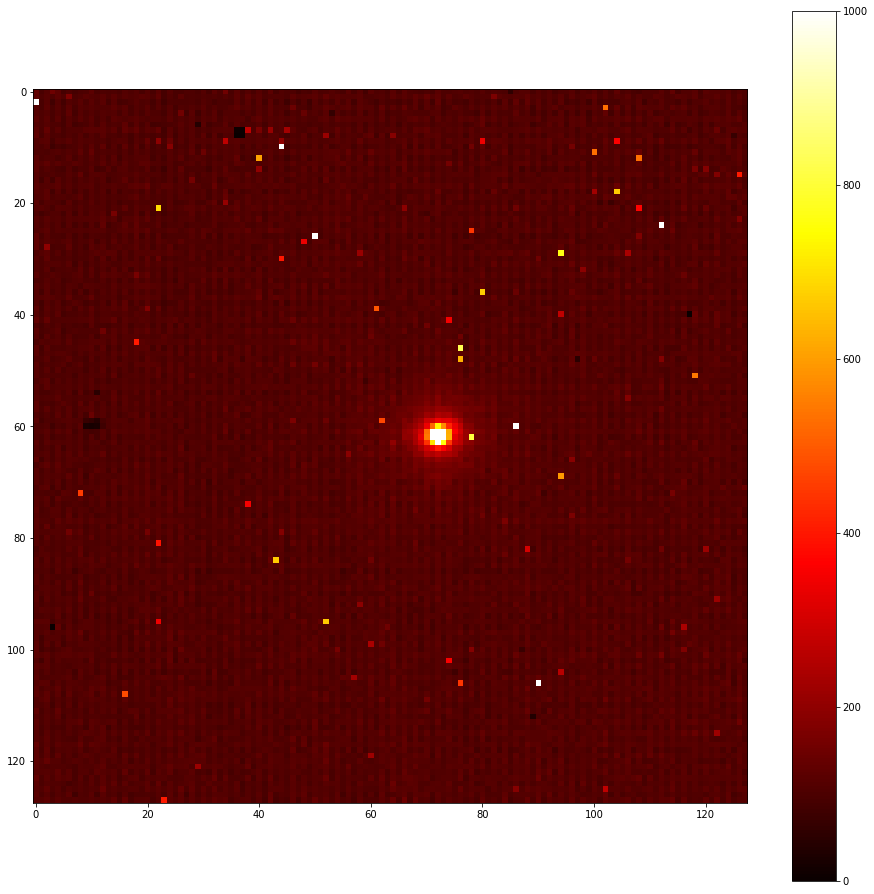

In [5]:
raw_sci = fits.open(filelist_sci[0])[0].data
crop = 128
dimx = raw_sci.shape[0]
dimy = raw_sci.shape[1]
x1 = int((dimx - crop)/2)
x2 = int(x1 + crop)
y1 = int((dimy - crop)/2)
y2 = int(y1 + crop)
raw_sci = shift(raw_sci,[-100,-100])
raw_cropped = raw_sci[x1:x2,y1:y2]
raw_cropped.shape
plt.figure(figsize=(16,16))
#plt.imshow(raw_cropped,vmin=0,vmax=200,cmap='hot') # see image of source
#plt.imshow(raw_cropped,vmin=0,vmax=100,cmap='hot') # see dead pixels and bright sky background
plt.imshow(raw_cropped,vmin=0,vmax=1000,cmap='hot') # see hot pixels
plt.colorbar()

### Median Flat-Dark

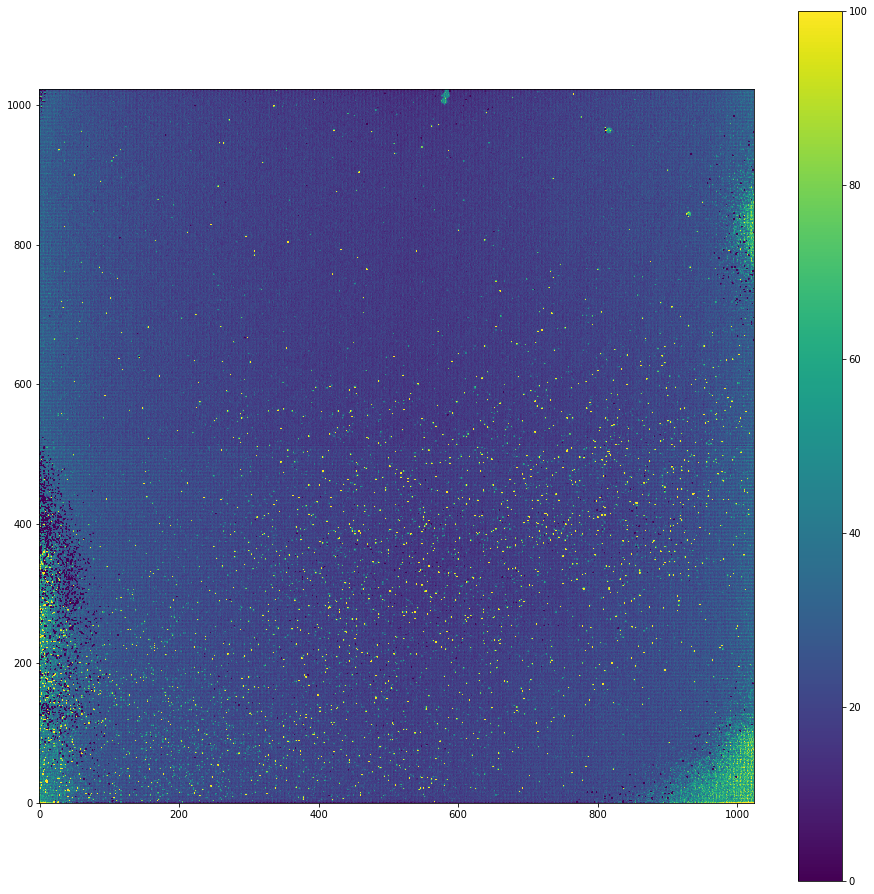

In [6]:
flats_darks_cube_tmp=[]
for filename in filelist_flats_darks:
    dummy = fits.open(filename)[0].data
    flats_darks_cube_tmp.append(dummy)
    
flats_darks_cube = np.array(flats_darks_cube_tmp)
masterflats_darks = np.median(flats_darks_cube,axis=0)
plt.figure(figsize=(16,16))
#plt.imshow(masterflats_darks,vmin=0,vmax=10) # show median dark frame
plt.imshow(masterflats_darks,vmin=0,vmax=100,origin ='lower') # shows grid-like structure and extra noise at corners (heat from electronics)
plt.colorbar()

### Median Master Flat

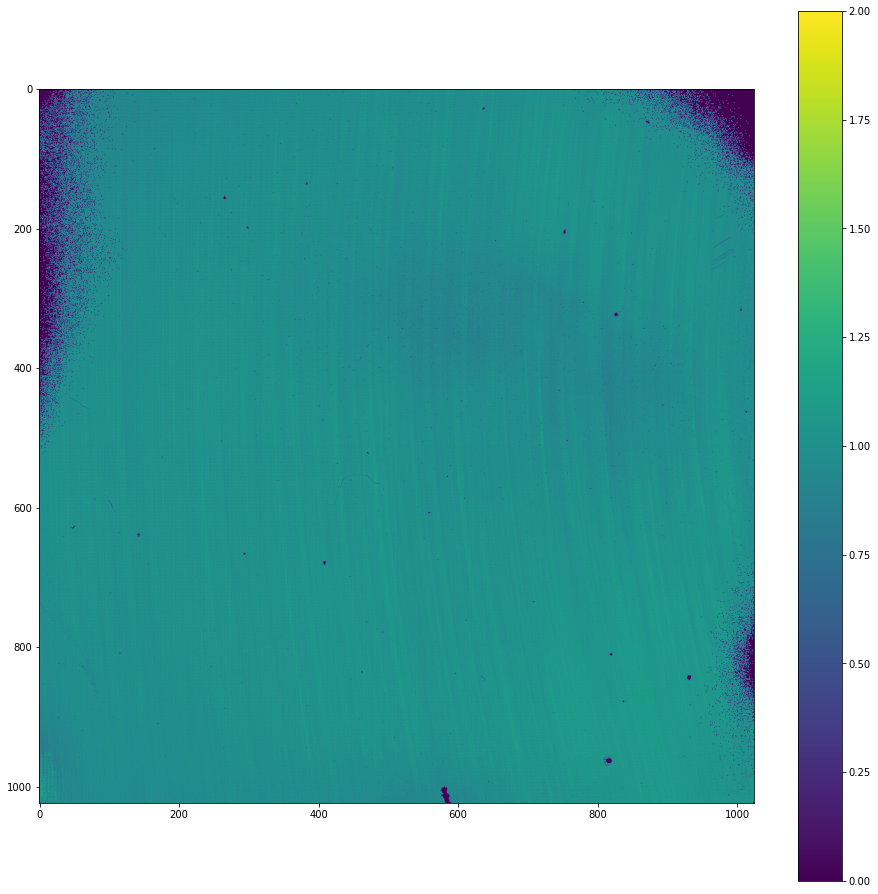

In [7]:
flats_cube_tmp=[]
for filename in filelist_flats:
    dummy = fits.open(filename)[0].data-masterflats_darks # subtrack dark frame from each flat
    flats_cube_tmp.append(dummy) # add up all of the flat fields

flats_cube = np.array(flats_cube_tmp)
masterflat = np.median(flats_cube,axis=0)
masterflat /= np.median(masterflat)
fits.writeto(path_output+'masterflat.fits',masterflat,overwrite=True)
plt.figure(figsize=(16,16))
plt.imshow(masterflat,vmin=0,vmax=2) # mostly green (near 1.0)
plt.colorbar()

### Cold Pixel Map

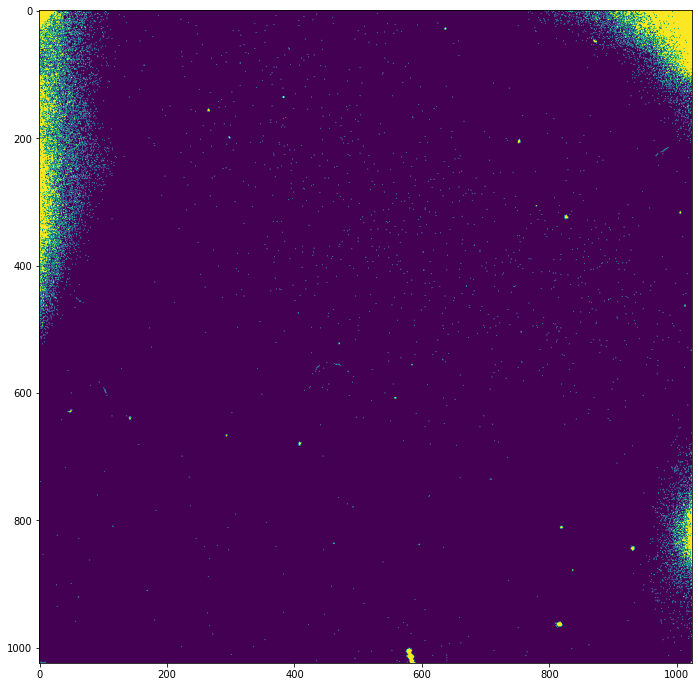

In [8]:
bpmap_cold = masterflat <= 0.7
plt.figure(figsize=(12,12))
plt.imshow(bpmap_cold)
fits.writeto(path_output+'bpmap_cold.fits',1.*bpmap_cold,overwrite=True)


### Masrer Dark

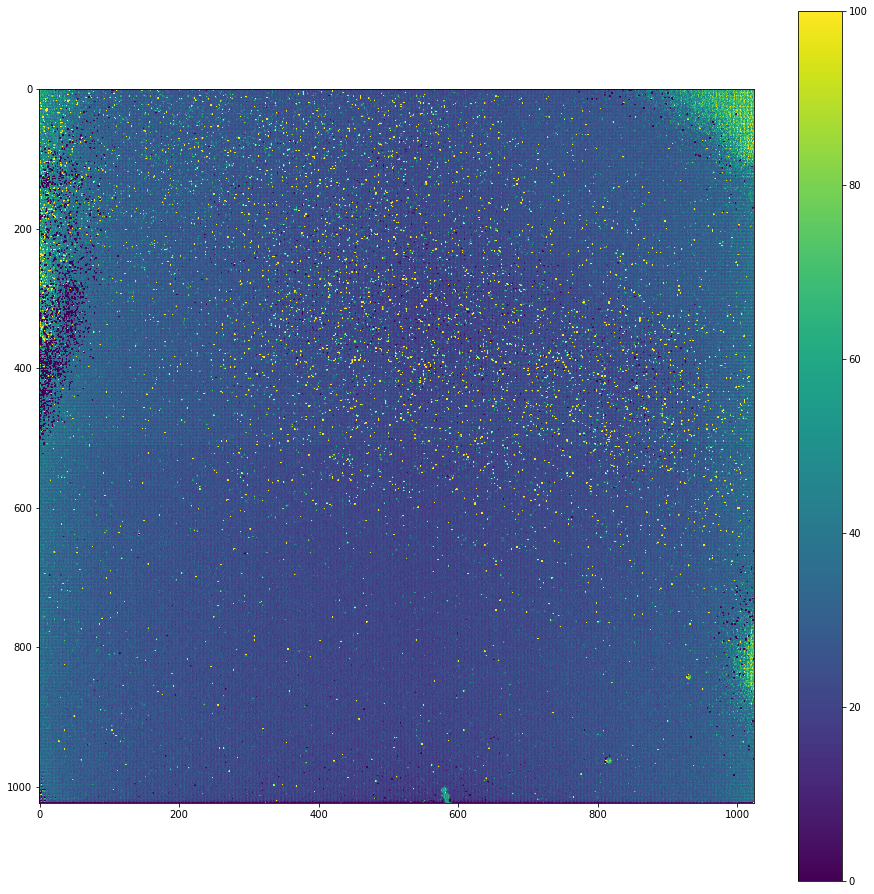

In [9]:
darks_cube_tmp=[]
for filename in filelist_darks:
    dummy = fits.open(filename)[0].data
    darks_cube_tmp.append(dummy)
kernel_size = 10
darks_cube = np.array(darks_cube_tmp)
masterdark = np.median(darks_cube,axis=0)
masterdark_median = median_filter(masterdark, kernel_size)
fits.writeto(path_output+'masterdark.fits',masterdark,overwrite=True)
plt.figure(figsize=(16,16))
plt.imshow(masterdark,vmin=0,vmax=100) # can see hot pixels if we change the color bar
plt.colorbar()

### Hot Pixel Map

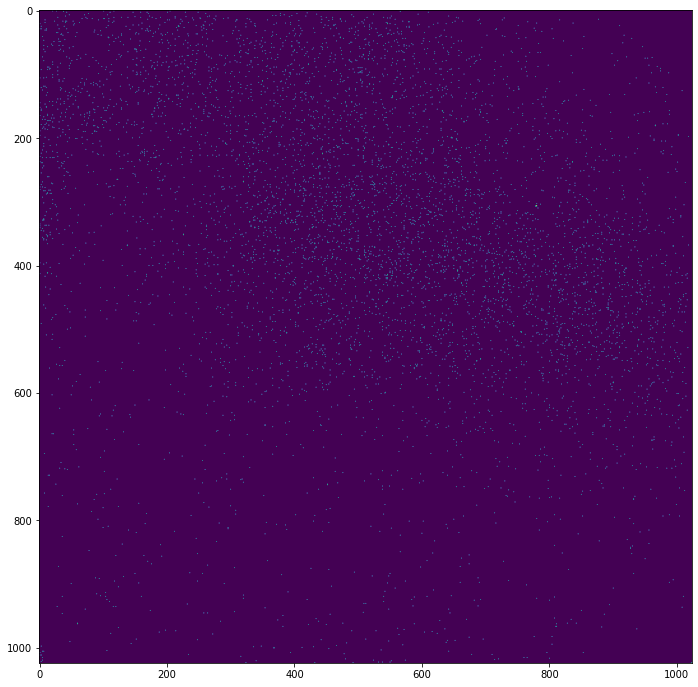

In [10]:
bpmap_hot = masterdark > 5*masterdark_median
plt.figure(figsize=(12,12))
fits.writeto(path_output+'bpmap_hot.fits',1.*bpmap_hot,overwrite=True)
plt.imshow(bpmap_hot)

### Full Bad Pixel Map

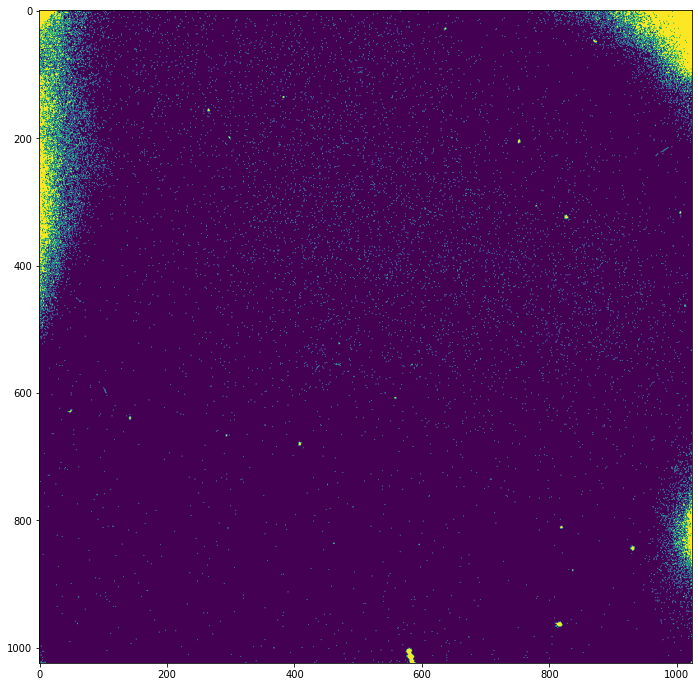

In [11]:
bpmap = bpmap_cold + bpmap_hot
plt.figure(figsize=(12,12))
plt.imshow(bpmap)
fits.writeto(path_output+'bpmap.fits',1.*bpmap,overwrite=True)

### Registering 

In [12]:
sci_cube_tmp=[]
sci_header_tmp=[]
shiftx_tmp=[]
shifty_tmp=[]
for filename in filelist_sci:
    hdu = fits.open(filename)[0]
    sci_header_tmp.append(hdu.header)
    data = hdu.data
    data -= masterdark   # subtract master dark image
    data /= masterflat   # divide by master flat image
    sci_cube_tmp.append(data)
    shiftx_tmp.append(hdu.header['HIERARCH ESO SEQ CUMOFFSETX'])
    shifty_tmp.append(hdu.header['HIERARCH ESO SEQ CUMOFFSETY'])

/var/folders/fk/_9cbh9653cx33t3sx7s4txr40000gn/T/ipykernel_43129/2616575555.py:10: RuntimeWarning: divide by zero encountered in true_divide
  data /= masterflat   # divide by master flat image
/var/folders/fk/_9cbh9653cx33t3sx7s4txr40000gn/T/ipykernel_43129/2616575555.py:10: RuntimeWarning: invalid value encountered in true_divide
  data /= masterflat   # divide by master flat image


### Sky Map

/Users/ramzisaber/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:179: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


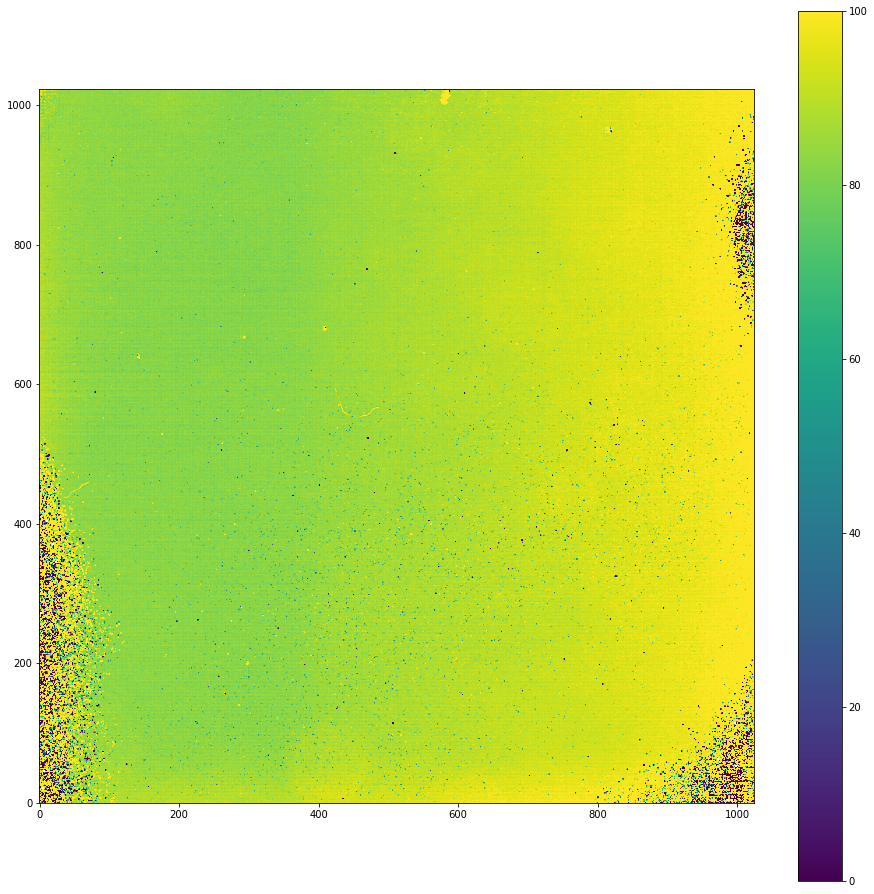

In [13]:
sci_cube = np.array(sci_cube_tmp)
sky = np.median(sci_cube,axis=0)
plt.figure(figsize=(16,16))
plt.imshow(sky,vmin=0,vmax=100, origin = 'lower')
plt.colorbar()

### Subtracting sky background from the science frames and replace bad pixels

/var/folders/fk/_9cbh9653cx33t3sx7s4txr40000gn/T/ipykernel_43129/1742542428.py:4: RuntimeWarning: invalid value encountered in subtract
  dummy -= sky


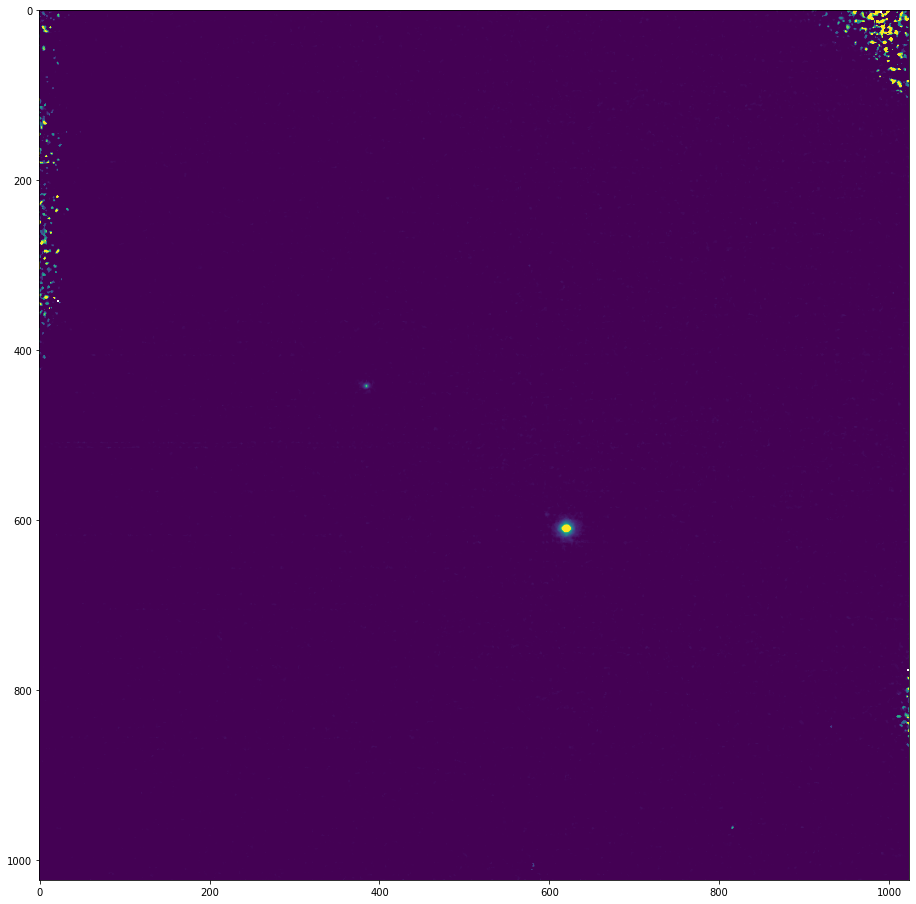

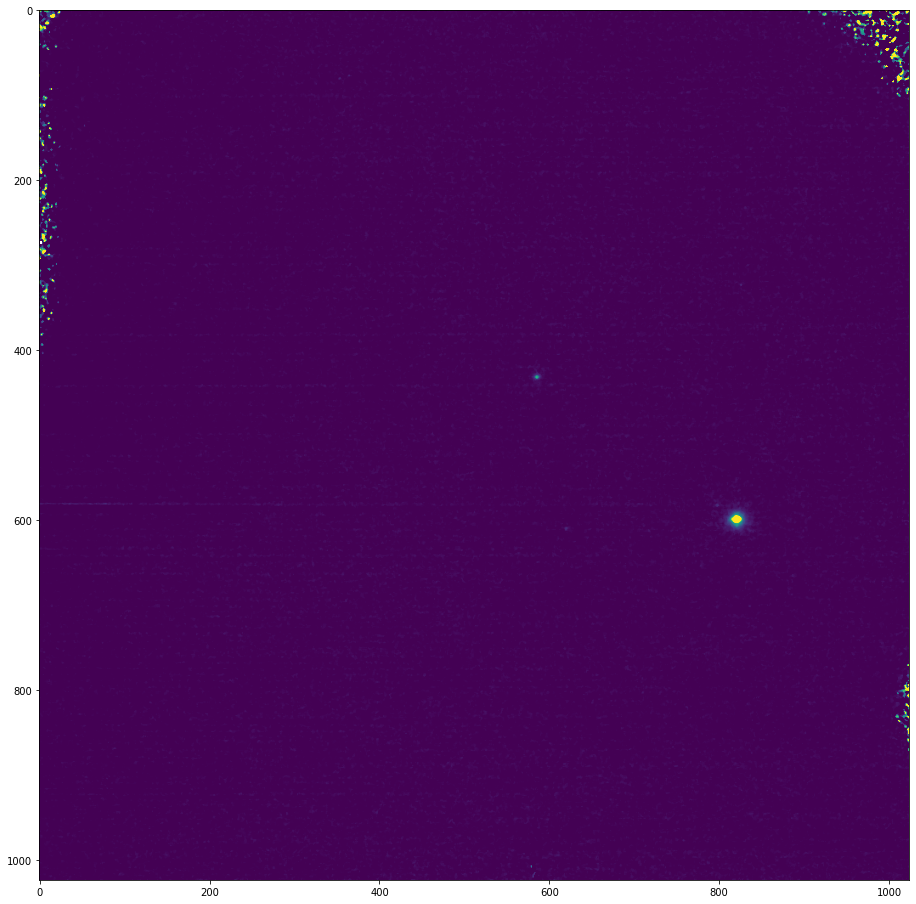

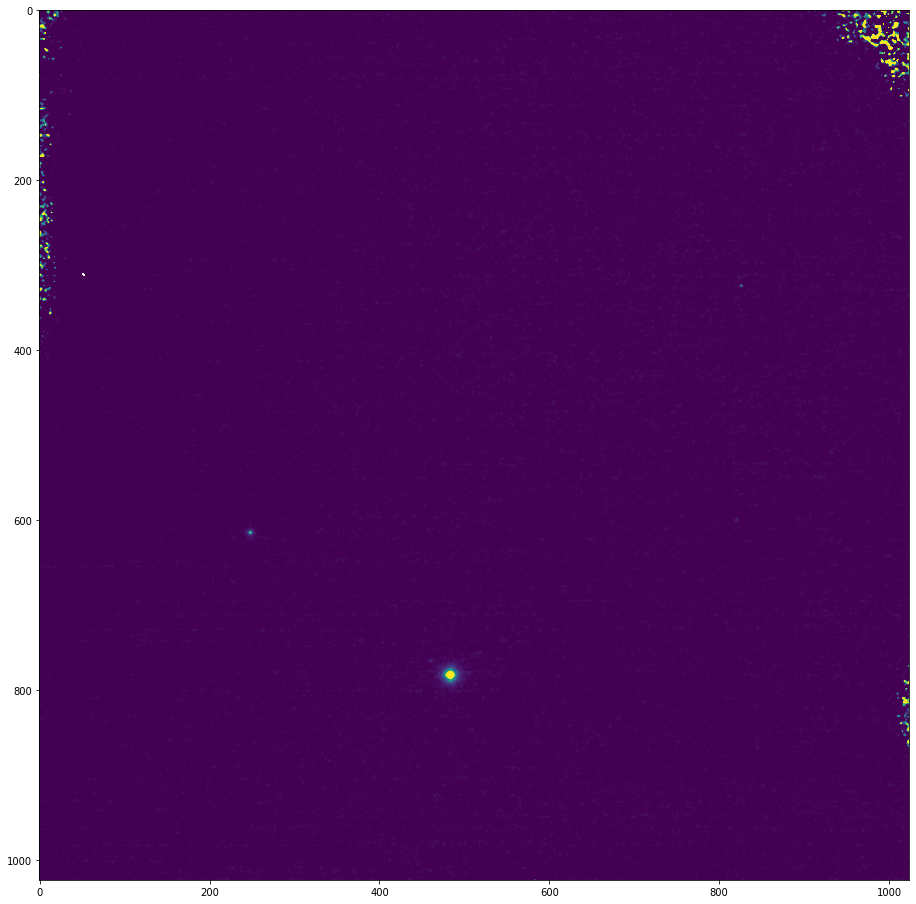

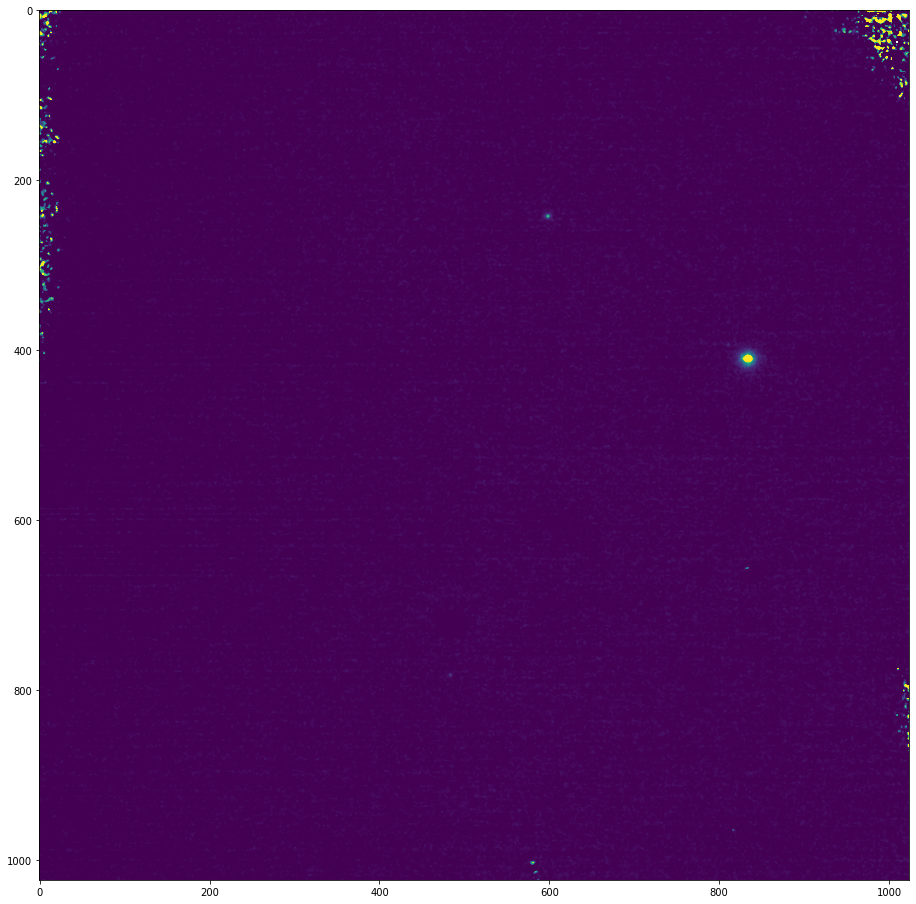

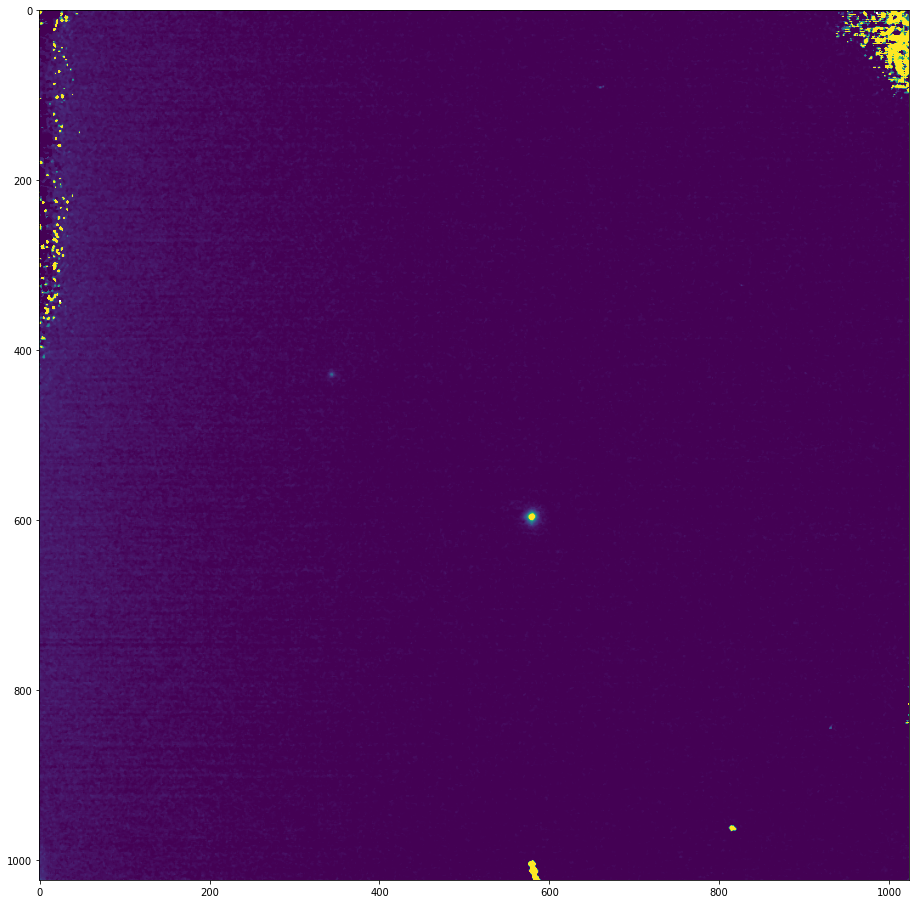

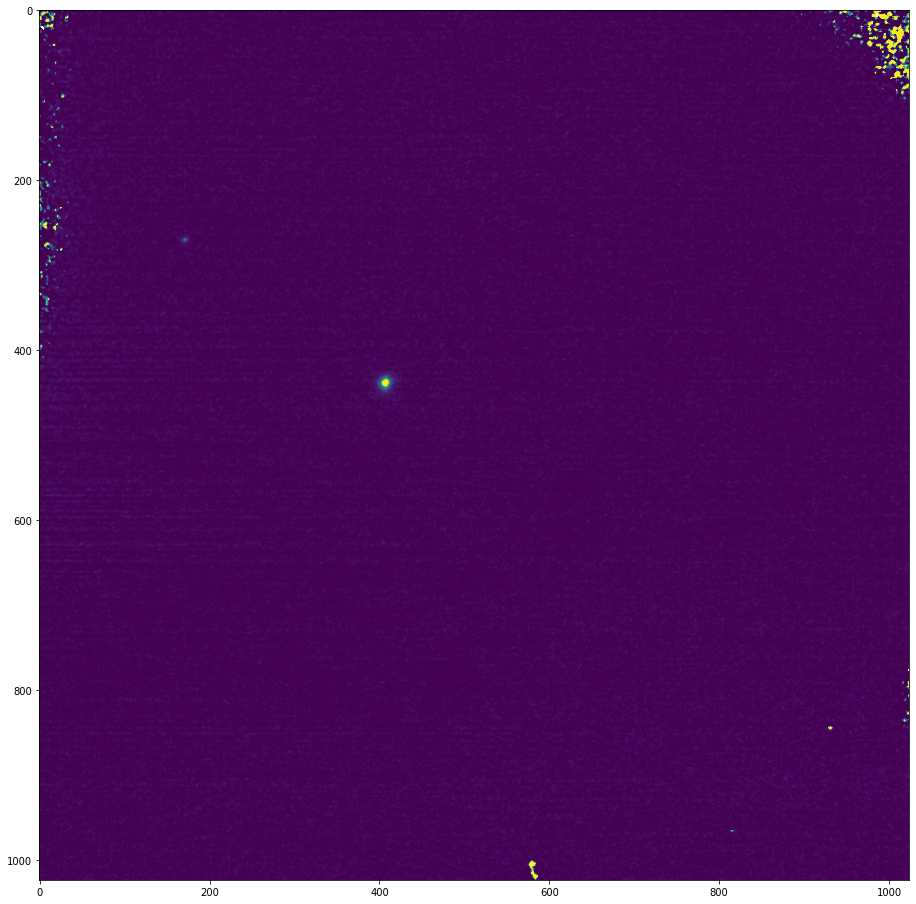

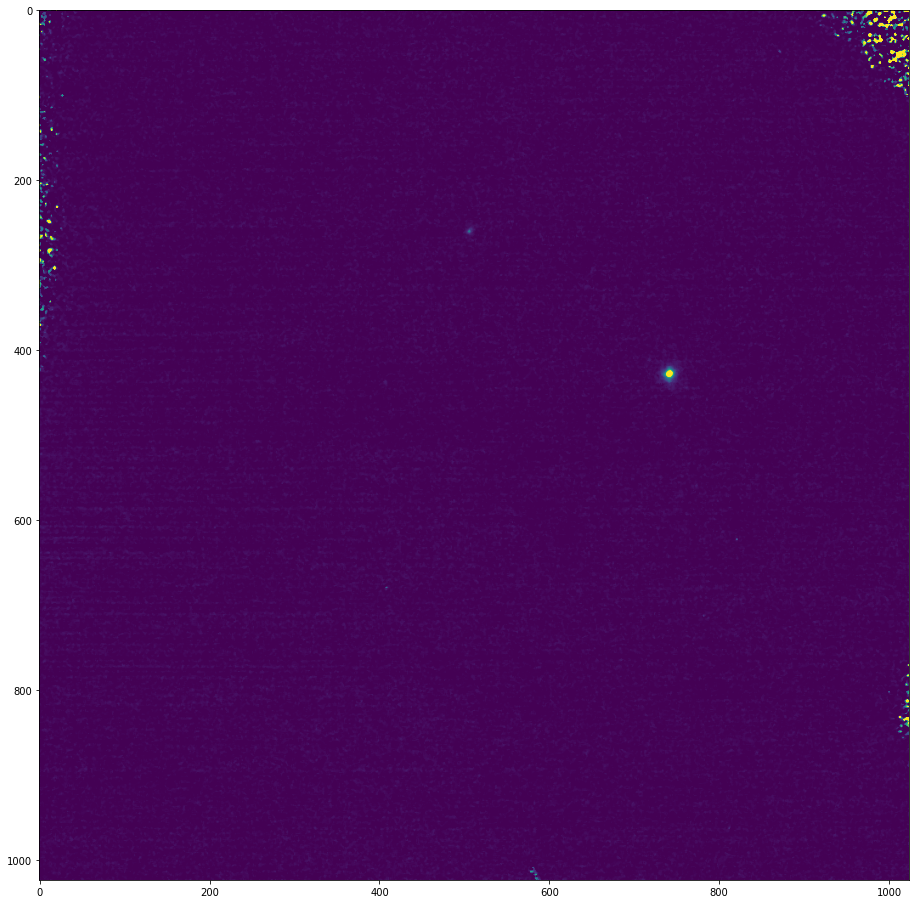

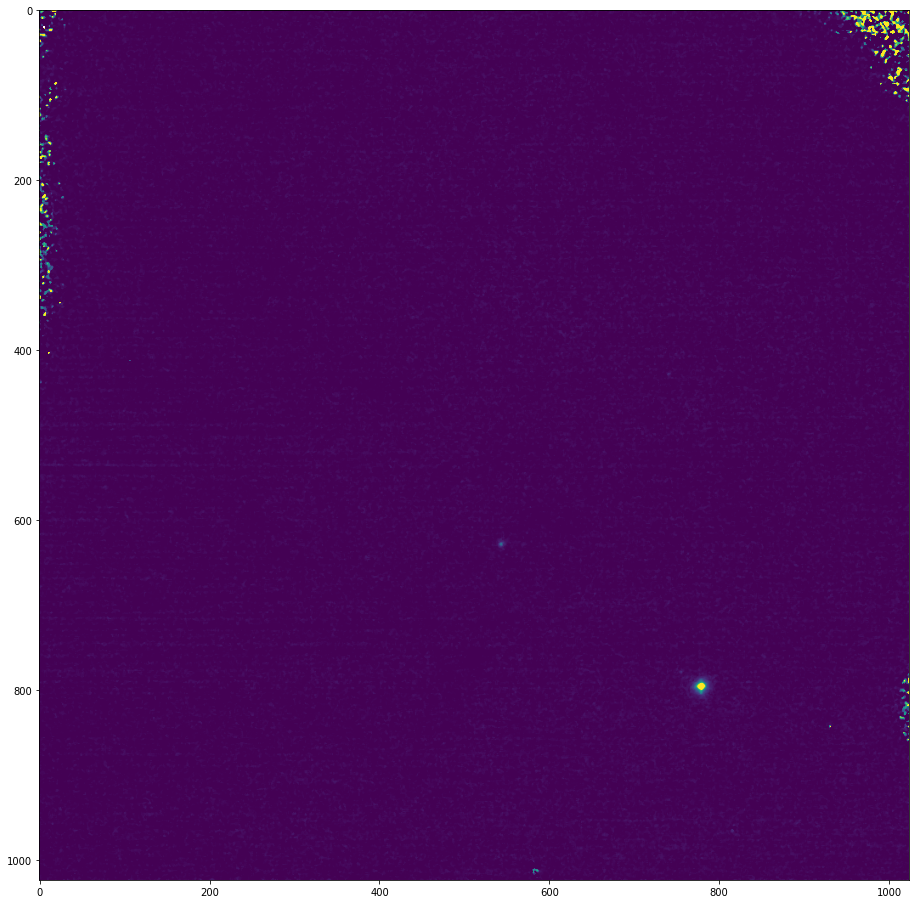

In [14]:
kernel_size = 3
for i in range(sci_cube.shape[0]):
    dummy = sci_cube[i,:,:]
    dummy -= sky
    dummy_median = median_filter(dummy,kernel_size)
    dummy[np.where(bpmap == True)]=dummy_median[np.where(bpmap == True)] # replace bad pixels from median of local pix
    sci_cube[i,:,:] = median_filter(dummy,kernel_size)
    plt.figure(figsize=(16,16)) # note clean images!
    plt.imshow(dummy,vmin=0,vmax=100)

In [15]:
fits.writeto(path_output+'test.fits',sci_cube,overwrite=True)

In [16]:
sci_cube.shape
crop = 768
dimx = sci_cube.shape[1]
dimy = sci_cube.shape[2]
x1 = int((sci_cube.shape[1] - crop)/2)
x2 = int(x1 + crop)
y1 = int((sci_cube.shape[2] - crop)/2)
y2 = int(y1 + crop)
sci_cube_cropped = sci_cube[:,x1:x2,y1:y2]
sci_cube_cropped.shape

(8, 768, 768)

### Shifting

In [17]:
sci_cube_shifted = np.copy(sci_cube_cropped)
for i in range(8):
    dummy = sci_cube_cropped[i,:,:]
    print(shiftx_tmp[i],shifty_tmp[i])
    sci_cube_shifted[i,:,:] = shift(dummy,[-shifty_tmp[i],-shiftx_tmp[i]], order=1)

sci_cube_shiftedb = np.copy(sci_cube_shifted)



0.0 0.0
197.0 -10.0
-134.0 170.0
210.0 -197.0
0.0 0.0
-169.0 -156.0
159.0 -166.0
196.0 198.0


In [18]:
cx=int(crop/2)
cy=int(crop/2)
for i in range(8):
    dummy = sci_cube_shiftedb[i,:,:]
    max_coord = np.unravel_index(np.argmax(dummy, axis=None), dummy.shape)
    print(np.unravel_index(np.argmax(dummy, axis=None), dummy.shape))
    shiftx = cx-max_coord[0]
    shifty = cy-max_coord[1]
    print(shiftx,shifty)
    sci_cube_shiftedb[i,:,:] = shift(dummy,[shiftx,shifty], order=1)

(481, 492)
-97 -108
(481, 495)
-97 -111
(484, 489)
-100 -105
(479, 496)
-95 -112
(468, 451)
-84 -67
(466, 448)
-82 -64
(466, 454)
-82 -70
(469, 455)
-85 -71


### Creating New Image Files

In [19]:
final_image = np.median(sci_cube_shiftedb[0:3,:,:],axis=0)
fits.writeto(path_output+'test2.fits',sci_cube_shiftedb,overwrite=True)

fits.writeto(path_output+'final_image.fits',final_image,overwrite=True)

### Final Image

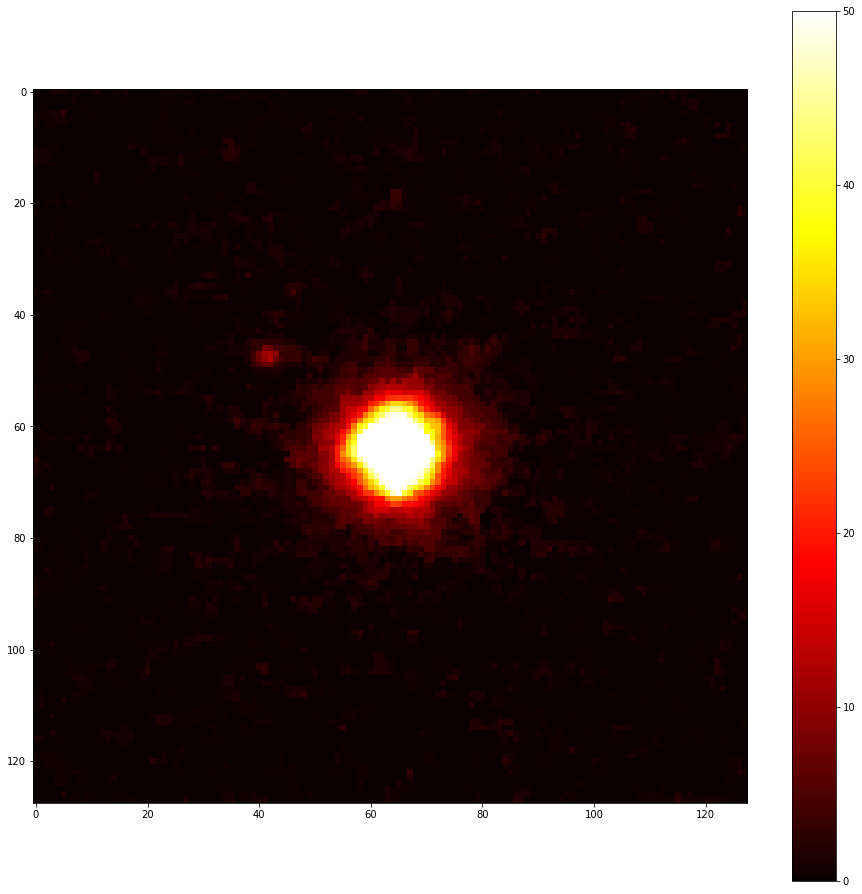

In [20]:
crop = 128
dimx = final_image.shape[0]
dimy = final_image.shape[1]
x1 = int((dimx - crop)/2)
x2 = int(x1 + crop)
y1 = int((dimy - crop)/2)
y2 = int(y1 + crop)
final_image_cropped = final_image[x1:x2,y1:y2]
final_image_cropped.shape

plt.figure(figsize=(16,16))
plt.imshow(final_image_cropped,vmin=0,vmax=50,cmap='hot')
plt.colorbar()

### Identifying Sources Using Photoutils

In [40]:
from photutils import DAOStarFinder
from astropy.stats import mad_std
bkg_sigma = mad_std(final_image_cropped)
daofind = DAOStarFinder(fwhm=4,threshold=10*bkg_sigma)  
sources = daofind(final_image_cropped)
for col in sources.colnames:
    sources[col].info.format = '%.8g'
print(sources)

 id xcentroid ycentroid sharpness  ... sky    peak      flux       mag    
--- --------- --------- ---------- ... --- --------- --------- -----------
  1 41.642084 47.436662 0.41084982 ...   0 11.696487 1.5292451 -0.46119275
  2 64.568959 64.108465 0.43041323 ...   0 1030.5647  133.7878  -5.3160413
  3 64.794873 71.696963 0.56676358 ...   0 47.159164 1.7840999 -0.62854792


In [41]:
from photutils import aperture_photometry, CircularAperture
positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
apertures = CircularAperture(positions, r=4.)
phot_table = aperture_photometry(final_image_cropped, apertures)
for col in phot_table.colnames:
    phot_table[col].info.format = '%.8g'
print(phot_table)

 id  xcenter   ycenter  aperture_sum
       pix       pix                
--- --------- --------- ------------
  1 41.642084 47.436662    192.28016
  2 64.568959 64.108465    16725.869
  3 64.794873 71.696963    2055.6349


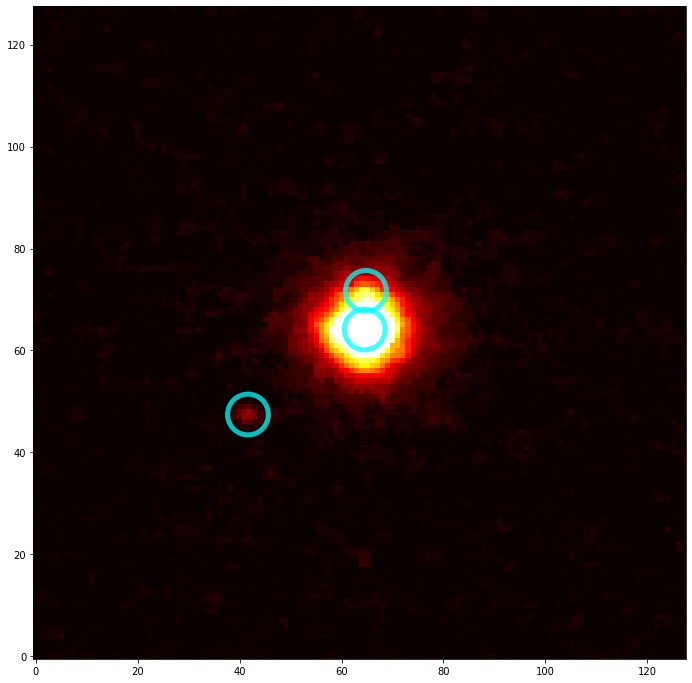

In [42]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,12))
plt.imshow(final_image_cropped,vmin=0,vmax=60,cmap='hot',origin='lower')
apertures.plot(color='cyan',lw=5,alpha=0.75)

### Flux Ratio & Magnitude

In [45]:
flux_ratio = 16725.869 / 192.28016
print('Flux Ratio:',flux_ratio)

mag_difference = 2.5*np.log10(flux_ratio)
print('Magnitude Difference:',mag_difference)

Flux Ratio: 86.98697255088616
Magnitude Difference: 4.848635540371155


In [46]:
# Brown Dwarf 2M1207 has H = 11.945
k_mag_brown_dwarf = 11.945
k_mag_planet = k_mag_brown_dwarf + mag_difference
print('H Band Planet Mag:',k_mag_planet)


H Band Planet Mag: 16.793635540371156
